### Importación de datos



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [2]:
print('ganancias tienda1: ', sum(tienda['Precio']))
print('ganancias tienda2: ', sum(tienda2['Precio']))
print('ganancias tienda3: ', sum(tienda3['Precio']))
print('ganancias tienda4: ', sum(tienda4['Precio']))

print(f"\nganancias totales: \t{sum(tienda['Precio']) + sum(tienda2['Precio']) + sum(tienda3['Precio']) + sum(tienda4['Precio'])}")

ganancias tienda1:  1150880400.0
ganancias tienda2:  1116343500.0
ganancias tienda3:  1098019600.0
ganancias tienda4:  1038375700.0

ganancias totales: 	4403619200.0


# 2. Ventas por categoría

In [3]:
desglose_por_categoria_T1 = tienda.groupby('Categoría del Producto')['Precio'].sum()
desglose_por_categoria_T2 = tienda2.groupby('Categoría del Producto')['Precio'].sum()
desglose_por_categoria_T3 = tienda3.groupby('Categoría del Producto')['Precio'].sum()
desglose_por_categoria_T4 = tienda4.groupby('Categoría del Producto')['Precio'].sum()

print(desglose_por_categoria_T1)
print(desglose_por_categoria_T2)
print(desglose_por_categoria_T3)
print(desglose_por_categoria_T4)

Categoría del Producto
Artículos para el hogar     12698400.0
Deportes y diversión        39290000.0
Electrodomésticos          363685200.0
Electrónicos               429493500.0
Instrumentos musicales      91299000.0
Juguetes                    17995700.0
Libros                       8784900.0
Muebles                    187633700.0
Name: Precio, dtype: float64
Categoría del Producto
Artículos para el hogar     14746900.0
Deportes y diversión        34744500.0
Electrodomésticos          348567800.0
Electrónicos               410831100.0
Instrumentos musicales     104990300.0
Juguetes                    15945400.0
Libros                      10091200.0
Muebles                    176426300.0
Name: Precio, dtype: float64
Categoría del Producto
Artículos para el hogar     15060000.0
Deportes y diversión        35593100.0
Electrodomésticos          329237900.0
Electrónicos               410775800.0
Instrumentos musicales      77380900.0
Juguetes                    19401100.0
Libros         

# 3. Calificación promedio de la tienda


In [4]:
print(round(sum(tienda['Calificación'])/len(tienda['Calificación']), 2))
print(round(sum(tienda2['Calificación'])/len(tienda2['Calificación']), 2))
print(round(sum(tienda3['Calificación'])/len(tienda3['Calificación']), 2))
print(round(sum(tienda4['Calificación'])/len(tienda4['Calificación']), 2))

3.98
4.04
4.05
4.0


# 4. Productos más y menos vendidos

In [5]:
def ventas_por_producto_dataframe(df):
  ventas_por_producto_tienda_proporcionada = df.groupby('Producto').size()
  fav_producto_ventas_dataframe = ventas_por_producto_tienda_proporcionada.idxmax()
  men_producto_ventas_dataframe = ventas_por_producto_tienda_proporcionada.idxmin()

  mayor_producto_dataframe = ventas_por_producto_tienda_proporcionada.max()
  menor_producto_dataframe= ventas_por_producto_tienda_proporcionada.min()

  producto_max_dataframe_txt = ventas_por_producto_tienda_proporcionada[ventas_por_producto_tienda_proporcionada == mayor_producto_dataframe].index.tolist()
  producto_min_dataframe_txt = ventas_por_producto_tienda_proporcionada[ventas_por_producto_tienda_proporcionada == menor_producto_dataframe].index.tolist()

  print(producto_max_dataframe_txt, ventas_por_producto_tienda_proporcionada[fav_producto_ventas_dataframe])
  print(producto_min_dataframe_txt, ventas_por_producto_tienda_proporcionada[men_producto_ventas_dataframe])

  return producto_max_dataframe_txt, ventas_por_producto_tienda_proporcionada[fav_producto_ventas_dataframe], producto_min_dataframe_txt, ventas_por_producto_tienda_proporcionada[men_producto_ventas_dataframe]

nombre_producto_max_dataframe1, cifra_ventas_max_producto1, nombre_producto_min_dataframe1, cifra_ventas_min_producto1 = ventas_por_producto_dataframe(tienda)
nombre_producto_max_dataframe2, cifra_ventas_max_producto2, nombre_producto_min_dataframe2, cifra_ventas_min_producto2 = ventas_por_producto_dataframe(tienda2)
nombre_producto_max_dataframe3, cifra_ventas_max_producto3, nombre_producto_min_dataframe3, cifra_ventas_min_producto3 = ventas_por_producto_dataframe(tienda3)
nombre_producto_max_dataframe4, cifra_ventas_max_producto4, nombre_producto_min_dataframe4, cifra_ventas_min_producto4 = ventas_por_producto_dataframe(tienda4)

['Armario', 'Microondas', 'TV LED UHD 4K'] 60
['Auriculares con micrófono', 'Celular ABXY'] 33
['Iniciando en programación'] 65
['Juego de mesa'] 32
['Kit de bancas'] 57
['Bloques de construcción'] 35
['Cama box'] 62
['Guitarra eléctrica'] 33


In [6]:
def top_ganancias_por_producto(df, num):
  ganancias_generadas_por_producto = df.groupby('Producto')['Precio'].sum()
  top1 = ganancias_generadas_por_producto.sort_values(ascending=False).iloc[0]
  top2 = ganancias_generadas_por_producto.sort_values(ascending=False).iloc[1]
  top3 = ganancias_generadas_por_producto.sort_values(ascending=False).iloc[2]

  top1_txt = ganancias_generadas_por_producto.sort_values(ascending=False).index
  top2_txt = ganancias_generadas_por_producto.sort_values(ascending=False).index
  top3_txt = ganancias_generadas_por_producto.sort_values(ascending=False).index

  mTop1_txt = ganancias_generadas_por_producto.sort_values(ascending=True).index[0]
  mTop2_txt = ganancias_generadas_por_producto.sort_values(ascending=True).index[1]
  mTop3_txt = ganancias_generadas_por_producto.sort_values(ascending=True).index[2]

  mTop1 = ganancias_generadas_por_producto[mTop1_txt]
  mTop2 = ganancias_generadas_por_producto[mTop2_txt]
  mTop3 = ganancias_generadas_por_producto[mTop3_txt]

  print(f'este es el top de productos con mayor recaudación para la tienda {num} \nlas ganancias que produce {top1_txt[0]} son: \t{top1}\nlas ganancias que produce {top2_txt[1]} son: \t{top2}\nlas ganancias que produce {top3_txt[2]} son: \t{top3}')
  print(f'\neste es el top de productos con menor recaudación para la tienda {num} \nlas ganancias que produce {mTop1_txt} son: \t{mTop1}\nlas ganancias que produce {mTop2_txt} son: \t{mTop2}\nlas ganancias que produce {mTop3_txt} son: \t{mTop3}')

top_ganancias_por_producto(tienda, 1)
top_ganancias_por_producto(tienda2, 2)
top_ganancias_por_producto(tienda3, 3)
top_ganancias_por_producto(tienda4, 4)

este es el top de productos con mayor recaudación para la tienda 1 
las ganancias que produce TV LED UHD 4K son: 	142150200.0
las ganancias que produce Refrigerador son: 	112143300.0
las ganancias que produce Iphone 15 son: 	97902200.0

este es el top de productos con menor recaudación para la tienda 1 
las ganancias que produce Cuerda para saltar son: 	652800.0
las ganancias que produce Dinosaurio Rex son: 	688900.0
las ganancias que produce Cubo mágico 8x8 son: 	696900.0
este es el top de productos con mayor recaudación para la tienda 2 
las ganancias que produce Iphone 15 son: 	113225800.0
las ganancias que produce TV LED UHD 4K son: 	103375000.0
las ganancias que produce Refrigerador son: 	97632500.0

este es el top de productos con menor recaudación para la tienda 2 
las ganancias que produce Cubo mágico 8x8 son: 	643600.0
las ganancias que produce Dinosaurio Rex son: 	770300.0
las ganancias que produce Cuerda para saltar son: 	856900.0
este es el top de productos con mayor recaud

# 5. Envío promedio por tienda

In [8]:
print(round(sum(tienda['Costo de envío'])/len(tienda['Costo de envío']), 2))
print(round(sum(tienda2['Costo de envío'])/len(tienda2['Costo de envío']), 2))
print(round(sum(tienda3['Costo de envío'])/len(tienda3['Costo de envío']), 2))
print(round(sum(tienda4['Costo de envío'])/len(tienda4['Costo de envío']), 2))

26018.61
25216.24
24805.68
23459.46


# 6. Agrupar datos resultantes

In [111]:
lista_tiendas = ["tienda", "tienda2", "tienda3", "tienda4"]

ingresos_t1 = sum(tienda['Precio'])
ingresos_t2 = sum(tienda2['Precio'])
ingresos_t3 = sum(tienda3['Precio'])
ingresos_t4 = sum(tienda4['Precio'])
ingresos_totales = ingresos_t1 + ingresos_t2 + ingresos_t3 + ingresos_t4
lista_de_ingresos = [ingresos_t1, ingresos_t2, ingresos_t3, ingresos_t4]

#desglose_por_categoria_T1
#desglose_por_categoria_T2
#desglose_por_categoria_T3
#desglose_por_categoria_T4


Calificacion_t1 = round(sum(tienda['Calificación'])/len(tienda['Calificación']), 2)
Calificacion_t2 = round(sum(tienda2['Calificación'])/len(tienda2['Calificación']), 2)
Calificacion_t3 = round(sum(tienda3['Calificación'])/len(tienda3['Calificación']), 2)
Calificacion_t4 = round(sum(tienda4['Calificación'])/len(tienda4['Calificación']), 2)


lista_de_calificaciones = [round(sum(tienda['Calificación'])/len(tienda['Calificación']), 2), round(sum(tienda2['Calificación'])/len(tienda2['Calificación']), 2), round(sum(tienda3['Calificación'])/len(tienda3['Calificación']), 2), round(sum(tienda4['Calificación'])/len(tienda4['Calificación']), 2)]

#nombre_produc to_max_dataframe1, cifra_ventas_max_producto1, nombre_producto_min_dataframe1, cifra_ventas_min_producto1
#nombre_producto_max_dataframe2, cifra_ventas_max_producto2, nombre_producto_min_dataframe2, cifra_ventas_min_producto2
#nombre_producto_max_dataframe3, cifra_ventas_max_producto3, nombre_producto_min_dataframe3, cifra_ventas_min_producto3
#nombre_producto_max_dataframe4, cifra_ventas_max_producto4, nombre_producto_min_dataframe4, cifra_ventas_min_producto4

ingreso_promedio_por_venta_t1 = round(ingresos_t1/len(tienda['Precio']), 2)
ingreso_promedio_por_venta_t2 = round(ingresos_t2/len(tienda2['Precio']), 2)
ingreso_promedio_por_venta_t3 = round(ingresos_t3/len(tienda3['Precio']), 2)
ingreso_promedio_por_venta_t4 = round(ingresos_t4/len(tienda4['Precio']), 2)

lista_de_ingresos_promedios = [ingreso_promedio_por_venta_t1, ingreso_promedio_por_venta_t2, ingreso_promedio_por_venta_t3, ingreso_promedio_por_venta_t4]

"""
print(ingresos_t1 - sum(tienda['Costo de envío']))
print(ingresos_t2 - sum(tienda2['Costo de envío']))
print(ingresos_t3 - sum(tienda3['Costo de envío']))
print(ingresos_t4 - sum(tienda4['Costo de envío']))
"""

"\nprint(ingresos_t1 - sum(tienda['Costo de envío']))\nprint(ingresos_t2 - sum(tienda2['Costo de envío']))\nprint(ingresos_t3 - sum(tienda3['Costo de envío']))\nprint(ingresos_t4 - sum(tienda4['Costo de envío']))\n"

# 7. Crear las graficas para visualizar las comparativas individuales

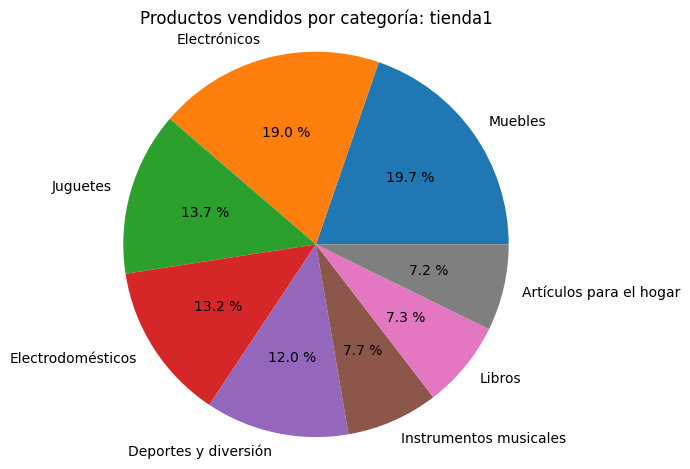

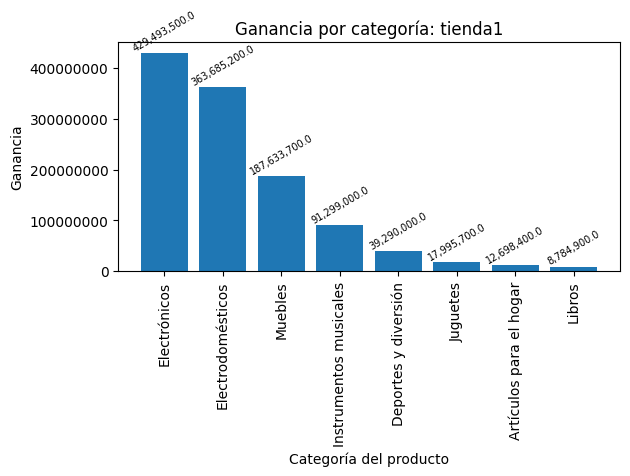

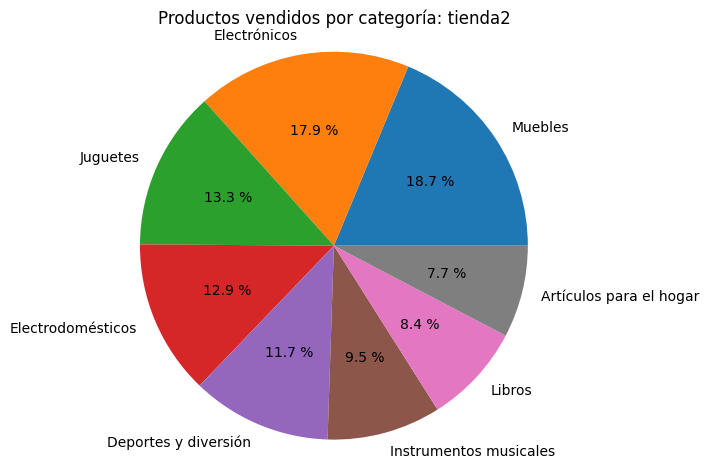

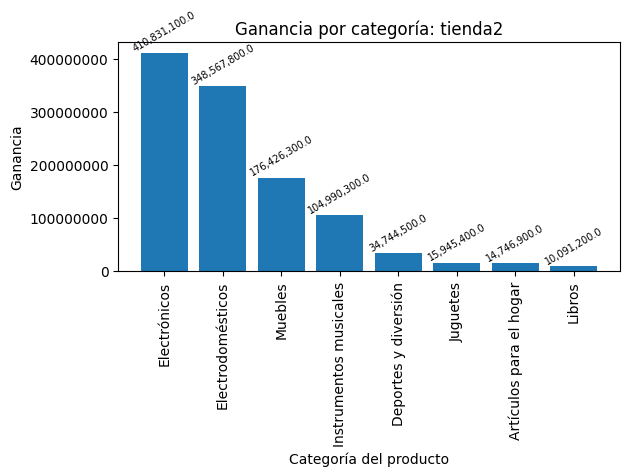

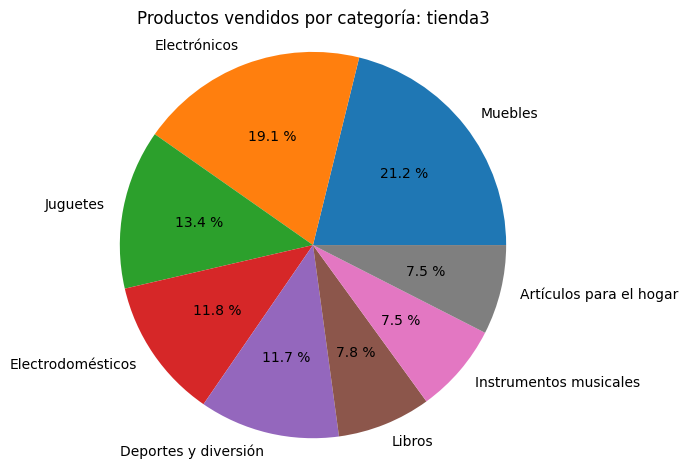

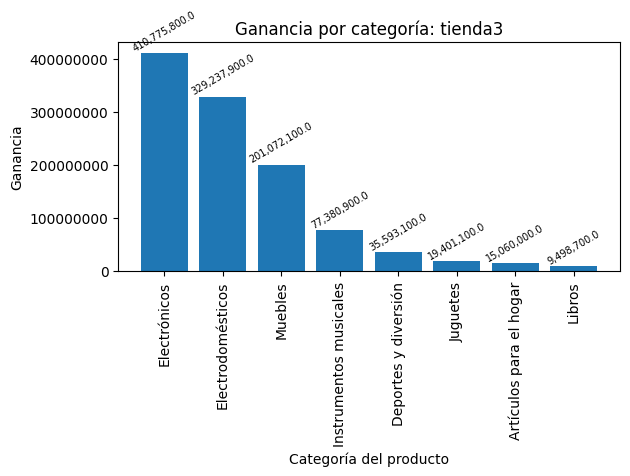

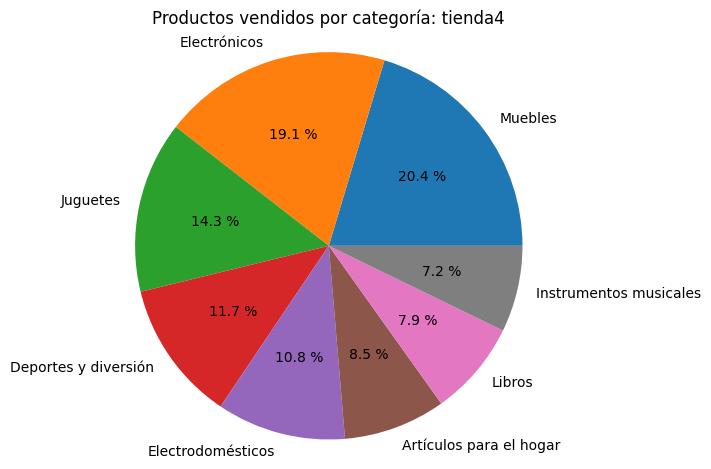

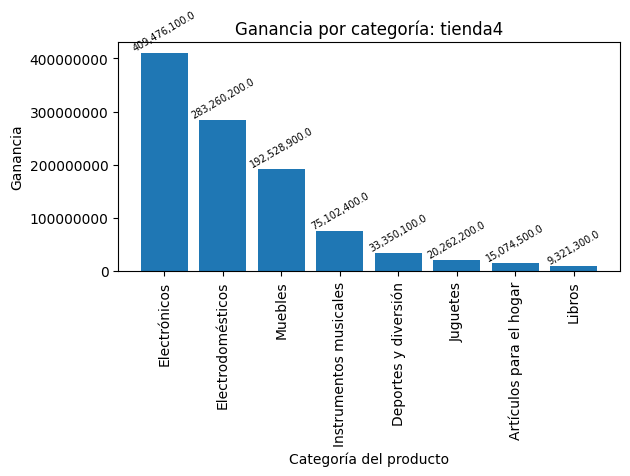

In [42]:
import matplotlib.pyplot as plt

def graficas(df, desglose, num):
  plt.pie(df['Categoría del Producto'].value_counts(), labels=df['Categoría del Producto'].value_counts().index, autopct="%0.1f %%")
  plt.axis("equal");
  plt.title(f"Productos vendidos por categoría: tienda{num}");
  plt.tight_layout()
  plt.show()

  desglose.sort_values(ascending=False, inplace=True)

  plt.bar(desglose.index, desglose.values)
  plt.ticklabel_format(style='plain', axis='y')
  for index, value in enumerate(desglose.values):
    plt.text(index, value, f'{value:,}', ha='center', va='bottom', fontsize=7, rotation=30)
  plt.xlabel("Categoría del producto")
  plt.ylabel("Ganancia")
  plt.title(f"Ganancia por categoría: tienda{num}")
  plt.xticks(rotation=90)
  plt.tight_layout()
  plt.show()

graficas(tienda, desglose_por_categoria_T1, 1)
graficas(tienda2, desglose_por_categoria_T2, 2)
graficas(tienda3, desglose_por_categoria_T3, 3)
graficas(tienda4, desglose_por_categoria_T4, 4)

#8. Comparativa final entre tiendas

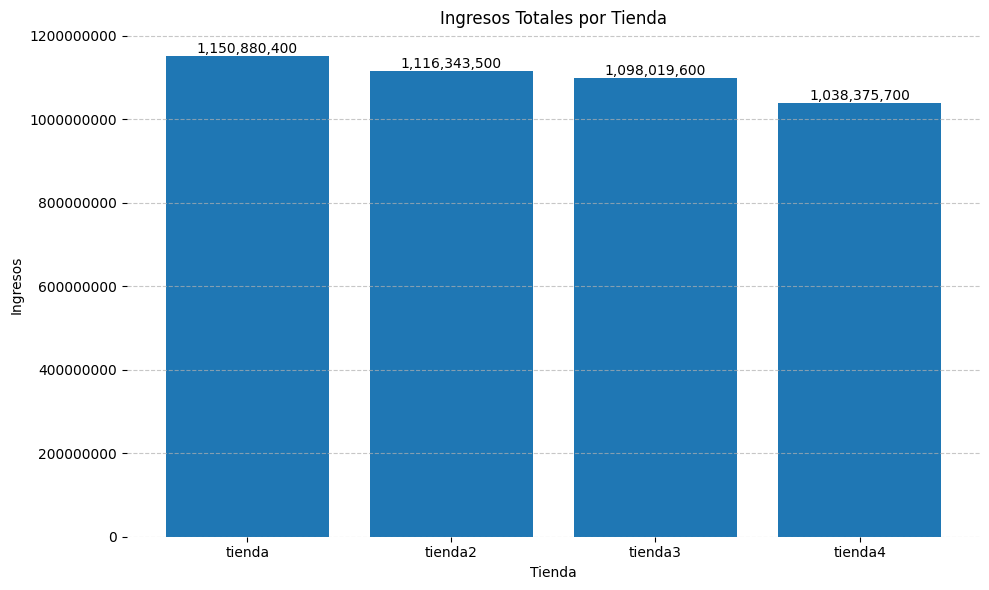

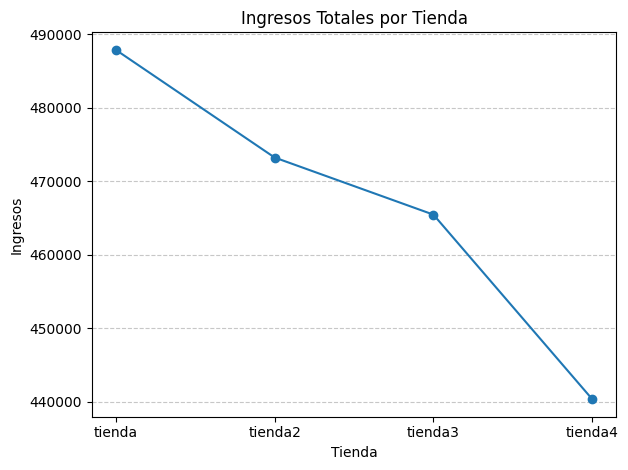

Text(0.5, 1.0, 'Calificación Totales por Tienda')

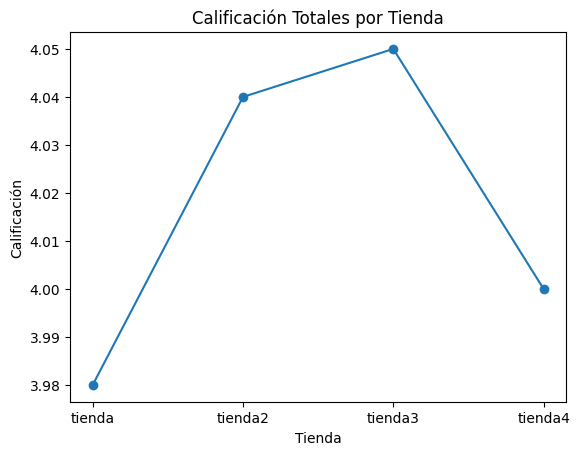

In [72]:
fig, ax = plt.subplots(figsize=(10, 6))
barras = ax.bar(lista_tiendas, lista_de_ingresos)
ax.ticklabel_format(style='plain', axis='y')
for barra in barras:
    yval = barra.get_height()
    ax.text(barra.get_x() + barra.get_width()/2, yval, f'{yval:,.0f}', ha='center', va='bottom', fontsize=10)
ax.grid(axis='y', linestyle='--', alpha=0.7)
for spine in ax.spines.values():
    spine.set_visible(False)

ax.set_xlabel("Tienda")
ax.set_ylabel("Ingresos")
ax.set_title("Ingresos Totales por Tienda")

plt.tight_layout()
plt.show()

plt.plot(lista_tiendas, lista_de_ingresos_promedios, marker='o')
plt.xlabel("Tienda")
plt.ylabel("Ingresos")
plt.title("Ingresos Totales por Tienda")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

plt.plot(lista_tiendas, lista_de_calificaciones, marker='o')
plt.xlabel("Tienda")
plt.ylabel("Calificación")
plt.title("Calificación Totales por Tienda")

#9. Informe

**Informe final**

para dar inicio al informe, se dará una breve introducción.

el cliente Juan, nos contacto para solicitar nuestro servicio de análisis empresarial para tomar una decisión importante acerca de como gestionar su cadena de tiendas "Alura Store".

en este caso, el Sr juan desea saber cual de las 4 sucursales, tiene un menor rendimiento.

basado en los datos recopilados, podemos sugerir el cierre y venta de la **"tienda 4"**, puesto a que presenta el menor ingreso, la segunda peor calificación de satisfacción entre los consumidores.

también nos gustaría hacer la observación acerca de el bajo aporte de la venta de **"Artículos para el hogar"**, y **"Libros"**.

según el análisis realizado, pudimos ver que, aunque la categoría **"Muebles"** encabeza las ventas, categorías como **"Electrónicos"** y **"Electrodomésticos"** generan mayores ganancias, mientras que **"Artículos para el hogar"** y **"Libros"** son, en su mayoría, los que menos se venden, simultáneamente, son los que menos ingresos registran a las tiendas.

el resto del informe será enviado a su correo electrónico.

atte

Equipo de análisis de datos

#9. EXTRA

In [105]:
import folium as fo
from folium.plugins import MarkerCluster

def mapa_de_ventas(df, nombre_tienda):

  mapa = fo.Map(location=[df['lat'].mean(), df['lon'].mean()], zoom_start=6)

  marker_cluster = MarkerCluster().add_to(mapa)

  for index, row in df.iterrows():
    popup_text = f"Producto: {row['Producto']}<br>Precio: {row['Precio']:,.2f}"

    fo.Marker(
        location=[row['lat'], row['lon']],
        popup=popup_text
    ).add_to(marker_cluster)

  title_html = f'<h3 align="center" style="font-size:16px"><b>Mapa de Ventas: {nombre_tienda}</b></h3>'
  mapa.get_root().html.add_child(fo.Element(title_html))

  display(mapa)


mapa_de_ventas(tienda, "Tienda 1")

In [106]:
mapa_de_ventas(tienda2, "Tienda 2")

In [107]:
mapa_de_ventas(tienda3, "Tienda 3")

In [108]:
mapa_de_ventas(tienda4, "Tienda 4")